# <img style="float: left; padding-right: 10px; width: 45px" src="https://raw.githubusercontent.com/Harvard-IACS/2018-CS109A/master/content/styles/iacs.png"> CS109A Introduction to Data Science: 

## Lending Club Project


**Harvard University**<br/>
**Fall 2018**<br/>

<hr style="height:2pt">



In [1]:
#RUN THIS CELL 
import requests
from IPython.core.display import HTML
styles = requests.get("https://raw.githubusercontent.com/Harvard-IACS/2018-CS109A/master/content/styles/cs109.css").text
HTML(styles)

In [2]:
import numpy as np
import pandas as pd
import datetime
import warnings
warnings.filterwarnings('ignore')

import statsmodels.api as sm
from statsmodels.api import OLS

from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LogisticRegressionCV
from sklearn.linear_model import LassoCV
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.preprocessing import PolynomialFeatures
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import KFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.utils import resample

# Plotly visualizations
from plotly import tools
import plotly.plotly as py
import plotly.figure_factory as ff
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import tensorflow as tf

from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
from sklearn.pipeline import make_pipeline
from sklearn.datasets import make_blobs
import sklearn.metrics as metrics
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import KFold
from sklearn.metrics import confusion_matrix

from sklearn.preprocessing import StandardScaler
import time

import math
from scipy.special import gamma

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
%matplotlib inline

import seaborn as sns
sns.set()
import matplotlib.style
matplotlib.style.use('seaborn-whitegrid')
sns.set_style("white")
from IPython.display import display
init_notebook_mode(connected=True)

<hr style="height:2pt">

<div class='theme'> Overview </div>

### This notebook contains the following sections:
* **Part 1**: Preparing the data
* **Part 2**: Resample to achieve balanced classes
* **Part 3**: Scale the data and generate train/test splits
* **Part 4** Determine significant predictors
* **Part 5**: Exploring the data

<div class='exercise'><b> Part 1: Preparing the data </b></div>

This notebook uses the cleaned CSV data file `data_cleaned_2016_2017.csv` downloaded from https://drive.google.com/open?id=1LCk-dDFC7O_6ek1i0IIGqE07Rq-kf1Xz. <br><br>
The cleaned dataset still needs some pre-processing in order to make it ready for modelling. This includes:

* Removing several more columns that are not informative, for example where they duplicate other information or only have a single value
* Drop the last digits of the zip code
* Recoding some ordinal variables into numerical scales
* Recoding some categorical variables into dummy variables

In [3]:
# increase some display options to display all columns and more rows.
pd.set_option('display.max_columns', None)
pd.options.display.max_rows = 150

In [4]:
# read in the 2016-2017 data set
original_df = pd.read_csv('data/data_cleaned_2016_2017.csv', low_memory = False)

In [5]:
display(original_df.shape)
original_df.head()

(334109, 92)

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,purpose,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,mths_since_last_major_derog,application_type,annual_inc_joint,dti_joint,acc_now_delinq,open_acc_6m,open_act_il,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,revol_bal_joint,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,sec_app_mths_since_last_major_derog
0,14000.0,14000.0,14000.0,1,15.99,340.38,C,C5,10.0,RENT,43000.0,Source Verified,2017,Charged Off,0,debt_consolidation,367xx,AL,21.80,1.0,1995,0.0,1,0,3.0,0.0,18537.0,99.1,8.0,1,0,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1,8035.0,42.0,0.0,0.0,18537.0,70.0,0.0,0.0,0.0,0.0,8857.0,163.0,99.1,0.0,0.0,1,1,1,1,0.0,1,0,0,0,0.0,1.0,1.0,1.0,2.0,5.0,1.0,3.0,1.0,3.0,0.0,0.0,0.0,0.0,87.5,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,5000.0,5000.0,5000.0,0,14.99,173.31,C,C4,10.0,RENT,68000.0,Not Verified,2017,Fully Paid,0,debt_consolidation,945xx,CA,22.50,0.0,2003,0.0,1,0,6.0,0.0,10276.0,90.1,18.0,0,0,0,0.0,0.0,0.0,0.0,2.0,0.0,2.0,1,25892.0,64.0,0.0,0.0,4261.0,69.0,1.0,1.0,0.0,2.0,6028.0,1124.0,90.1,0.0,0.0,1,1,1,1,0.0,1,0,1,0,0.0,4.0,4.0,4.0,6.0,8.0,4.0,9.0,4.0,6.0,0.0,0.0,0.0,0.0,94.4,75.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,10150.0,10150.0,10150.0,0,7.24,314.52,A,A3,8.0,MORTGAGE,50000.0,Not Verified,2017,Fully Paid,0,debt_consolidation,773xx,TX,29.60,0.0,2002,1.0,0,0,9.0,0.0,21845.0,56.0,21.0,1,0,0,0.0,0.0,0.0,1.0,3.0,1.0,1.0,1,23502.0,43.0,0.0,0.0,11270.0,49.0,1.0,1.0,2.0,2.0,29908.0,13951.0,58.2,0.0,0.0,1,1,1,1,3.0,1,0,1,0,0.0,3.0,4.0,3.0,5.0,8.0,5.0,10.0,4.0,9.0,0.0,0.0,0.0,2.0,100.0,33.3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,8400.0,8400.0,8400.0,0,11.39,276.56,B,B3,8.0,MORTGAGE,50000.0,Source Verified,2017,Charged Off,0,other,454xx,OH,15.63,0.0,2005,0.0,0,0,14.0,0.0,12831.0,30.3,30.0,1,0,0,0.0,0.0,0.0,3.0,2.0,1.0,2.0,1,38760.0,105.0,4.0,8.0,5338.0,65.0,4.0,1.0,7.0,10.0,12389.0,24145.0,33.1,0.0,0.0,1,1,1,1,4.0,1,0,1,0,0.0,4.0,5.0,7.0,11.0,9.0,11.0,16.0,5.0,14.0,0.0,0.0,0.0,5.0,100.0,14.3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,10000.0,10000.0,10000.0,0,12.74,335.69,C,C1,10.0,OWN,40000.0,Not Verified,2017,Fully Paid,0,debt_consolidation,324xx,FL,8.85,0.0,1997,0.0,0,0,7.0,0.0,9227.0,55.9,15.0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.0,1.0,3.0,5454.0,56.0,0.0,0.0,1.0,3.0,1318.0,1691.0,79.4,0.0,0.0,1,1,1,1,2.0,1,0,1,0,0.0,2.0,4.0,2.0,3.0,2.0,7.0,11.0,4.0,7.0,0.0,0.0,0.0,1.0,100.0,50.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


We now use the `pd.DataFrame.corr()` function to find correlations between variables. A value of 1.0 means the variables are perfectly correlated and a value of 0 means they're not correlated at all. We decided on a threshold value of $> 0.9$.

In [6]:
correlations = original_df.corr()
threshold = 0.9

# display entire matrix and color in red if predictors > threshold
correlations.style.apply(lambda x: ["background: red" if v > threshold else "" for v in x], axis = 1)

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,emp_length,annual_inc,issue_d,pymnt_plan,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,mths_since_last_major_derog,application_type,annual_inc_joint,dti_joint,acc_now_delinq,open_acc_6m,open_act_il,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,revol_bal_joint,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,sec_app_mths_since_last_major_derog
loan_amnt,1,1,0.999993,0.371943,0.171388,0.955203,0.100803,0.290591,-0.0223079,nan,0.0354099,-0.00144835,-0.138749,-0.00949889,-0.00402864,-0.067105,0.17634,-0.0470971,0.300435,0.119665,0.190422,0.0639881,-0.0380772,0.10254,0.128165,0.0989231,0.0017271,-0.0153681,0.0304857,0.00200697,0.0315075,0.0499328,0.157087,-0.0383439,-0.034697,-0.017261,0.353818,0.0146875,0.00764786,0.0695528,0.0164975,0.019626,0.215998,0.188939,0.0761079,-0.00195514,0.00276253,nan,nan,nan,nan,0.212504,0.0462264,-0.0068254,0.0138877,-0.00389924,-0.043254,0.199607,0.161251,0.220138,0.199425,0.0729088,0.160412,0.163052,0.157129,0.176213,0.0013363,0.00312459,-0.0185283,-0.012524,0.0702641,0.04447,-0.0722752,0.0132666,0.0917166,0.0306949,0.0654644,0.0748128,0.0651616,0.0497933,0.0739727,0.000238559,0.000519739,0.025622
funded_amnt,1,1,0.999993,0.371943,0.171388,0.955203,0.100803,0.290591,-0.0223079,nan,0.0354099,-0.00144835,-0.138749,-0.00949889,-0.00402864,-0.067105,0.17634,-0.0470971,0.300435,0.119665,0.190422,0.0639881,-0.0380772,0.10254,0.128165,0.0989231,0.0017271,-0.0153681,0.0304857,0.00200697,0.0315075,0.0499328,0.157087,-0.0383439,-0.034697,-0.017261,0.353818,0.0146875,0.00764786,0.0695528,0.0164975,0.019626,0.215998,0.188939,0.0761079,-0.00195514,0.00276253,nan,nan,nan,nan,0.212504,0.0462264,-0.0068254,0.0138877,-0.00389924,-0.043254,0.199607,0.161251,0.220138,0.199425,0.0729088,0.160412,0.163052,0.157129,0.176213,0.0013363,0.00312459,-0.0185283,-0.012524,0.0702641,0.04447,-0.0722752,0.0132666,0.0917166,0.0306949,0.0654644,0.0748128,0.0651616,0.0497933,0.0739727,0.000238559,0.000519739,0.025622
funded_amnt_inv,0.999993,0.999993,1,0.372176,0.171397,0.955109,0.100855,0.290609,-0.0221908,nan,0.0353379,-0.00149396,-0.138754,-0.0095706,-0.00407488,-0.0671567,0.176311,-0.0471432,0.300432,0.119642,0.190395,0.0647964,-0.0381205,0.102532,0.12816,0.0989095,0.00170044,-0.0154125,0.0304666,0.00198669,0.0314859,0.0499276,0.157077,-0.0383544,-0.0347373,-0.0173085,0.353833,0.0146675,0.00763789,0.0695417,0.0164552,0.0195828,0.216055,0.188967,0.0760853,-0.00196807,0.00274976,nan,nan,nan,nan,0.212543,0.0462363,-0.00685981,0.0138697,-0.00393152,-0.0432889,0.199572,0.161207,0.220116,0.199397,0.0728883,0.160384,0.163024,0.157086,0.176186,0.00131546,0.00310217,-0.018561,-0.0125626,0.0703008,0.0444573,-0.0723112,0.0132395,0.0917409,0.0307082,0.0654809,0.0748344,0.065188,0.0498072,0.0739973,0.000241002,0.000524948,0.0256408
term,0.371943,0.371943,0.372176,1,0.394674,0.14862,0.0600385,0.0547661,0.0123301,nan,0.0483536,-0.0106056,-0.0360779,0.00795103,-0.0100385,-0.0059825,0.0711056,-0.0108748,0.0722922,0.0578313,0.0880162,0.176625,-0.0140784,0.0642611,0.0643084,0.0637183,-0.00242646,0.01399

* Remove the following variables, since they all only have `NaN` values in every column, which doesn't seem very useful for anything.
    * `mo_sin_old_il_acct`
    * `mo_sin_old_rev_tl_op`
    * `mo_sin_rcnt_rev_tl_op`
    * `mo_sin_rcnt_tl`
    * `pmnt_plan`

* `make_scatterplot` (below) can be used to have a closer look at some of the variables that showed as highly correlated in the above analysis. Based on the correlation analysis, we therefore also decided to remove the following columns:<br>
    * `funded_amnt`
    * `funded_amnt_inv`
    * `num_sats`
    * `application_type`
    * `num_actv_rev_tl`
    * `sec_app_num_rev_accts`

In [7]:
def make_scatterplot(x, y):
    '''Plots a scatter plot graph
    Inputs:
        x, y: pd.Series objects representing the x and y values to plot
    '''
    fig = plt.figure(figsize=(8,5))
    plt.scatter(x, y, alpha=0.8)
    plt.title('Compare two variables', fontsize=16)
    plt.xlabel(x.name, fontsize=14)
    plt.ylabel(y.name, fontsize=14)
    plt.legend(loc='best')
    plt.show()

Now we encode the ordinal and nominal categorical variables and drop the last two `xx` for zip_code:

In [8]:
object_columns = []
for column in original_df:
    if original_df[column].dtype == 'object':
        object_columns.append(column)
object_columns

['grade',
 'sub_grade',
 'home_ownership',
 'verification_status',
 'loan_status',
 'purpose',
 'zip_code',
 'addr_state']

In [9]:
# One function to do all of the above operations
def data_prep(df):
    '''Returns a cleaned up dataframe as basis for the EDA analysis
    Input:
        df: the pd.DataFrame object
    Returns:
        clean_df: pd.DataFrame object
    '''
    clean_df = df.copy()
    # Definitions
    cols_to_remove = ['mo_sin_old_il_acct', 'mo_sin_old_rev_tl_op', 'mo_sin_rcnt_rev_tl_op', 
                      'mo_sin_rcnt_tl', 'funded_amnt', 'funded_amnt_inv', 'num_sats', 
                   'application_type', 'num_actv_rev_tl', 'sec_app_num_rev_accts', 'pymnt_plan']
    nominal_columns = ['home_ownership', 'verification_status', 'purpose', 'addr_state']
    prefixes = ['home', 'verify', 'purp', 'state']
    
    # Drop additional uninformative columns
    clean_df = clean_df.drop(columns=cols_to_remove)
    
    # strip xx from zip code
    clean_df["zip_code"] = [x.strip("xx") for x in clean_df["zip_code"].astype(str)]
    clean_df["zip_code"] = clean_df["zip_code"].astype(int)
    
    # exclude zip code from set of predictors for analysis
    # to be added back in later for checking discrimination...
    clean_df = clean_df.drop(columns='zip_code')

    
    # ordinal columns are encoded as numerical values, as there is an order
    clean_df["grade"].replace({"A": 1, "B": 2, "C": 3, "D": 4, "E": 5, "F": 6, "G": 7}, inplace = True)
    clean_df["sub_grade"].replace({"A1": 1, "A2": 2, "A3": 3, "A4": 4, "A5": 5,
                                "B1": 6, "B2": 7, "B3": 8, "B4": 9, "B5": 10,
                                "C1": 11, "C2": 12, "C3": 13, "C4": 14, "C5": 15,
                                "D1": 16, "D2": 17, "D3": 18, "D4": 19, "D5": 20,
                                "E1": 21, "E2": 22, "E3": 23, "E4": 24, "E5": 25,
                                "F1": 26, "F2": 27, "F3": 28, "F4": 29, "F5": 30,
                                "G1": 31, "G2": 32, "G3": 33, "G4": 34, "G5": 35}, inplace = True)

    # nominal columns are encoded via hot encoding by adding more columns
    clean_df = pd.get_dummies(clean_df, columns=nominal_columns, prefix=prefixes, drop_first=True)

    return clean_df

In [10]:
df_all = data_prep(original_df)

In [11]:
df_all.shape

(334109, 143)

<div class='exercise'><b> Part 2: Resample to achieve balanced classes </b></div>

Since we have imbalanced classes that can cause misleading assessment of model performance, we resample the classes here. We also take the opportunity to reduce the dataset size in the initial stages, so that different model specifications can be tested faster.

In [12]:
# Check balance of target values - it is unbalanced
df_all["loan_status"].value_counts().to_frame()

,loan_status
Fully Paid,255116
Charged Off,78993


In [15]:
# Downsample and create balanced classes
def balance_classes(df, n_samples):
    # Define majority and minority classes, 1 = Fully paid, 0 = Charged off
    df_majority = df[df["loan_status"] == "Fully Paid"]
    df_minority = df[df["loan_status"] == "Charged Off"]

    # Downsample majority class
    df_majority_downsampled = resample(df_majority, 
                                     replace = False,    # sample without replacement
                                     n_samples = n_samples,   
                                     random_state = 1) # set random seed for reproducability

    # Downsample minority class
    df_minority_downsampled = resample(df_minority, 
                                     replace = False,
                                     n_samples = n_samples,   
                                     random_state = 1) 

    # Recombine
    df_downsampled = pd.concat([df_majority_downsampled, df_minority_downsampled])

    return df_downsampled

In [16]:
# Define how many samples of each we want
n_samples = 10000

df = balance_classes(df_all, n_samples)

In [17]:
df["loan_status"].value_counts().to_frame()

,loan_status
Charged Off,10000
Fully Paid,10000


In [18]:
display(df.describe())

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_length,annual_inc,issue_d,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,mths_since_last_major_derog,annual_inc_joint,dti_joint,acc_now_delinq,open_acc_6m,open_act_il,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,revol_bal_joint,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,sec_app_mths_since_last_major_derog,home_MORTGAGE,home_NONE,home_OWN,home_RENT,verify_Source Verified,verify_Verified,purp_credit_card,purp_debt_consolidation,purp_home_improvement,purp_house,purp_major_purchase,purp_medical,purp_moving,purp_other,purp_renewable_energy,purp_small_business,purp_vacation,purp_wedding,state_AL,state_AR,state_AZ,state_CA,state_CO,state_CT,state_DC,state_DE,state_FL,state_GA,state_HI,state_ID,state_IL,state_IN,state_KS,state_KY,state_LA,state_MA,state_MD,state_ME,state_MI,state_MN,state_MO,state_MS,state_MT,state_NC,state_ND,state_NE,state_NH,state_NJ,state_NM,state_NV,state_NY,state_OH,state_OK,state_OR,state_PA,state_RI,state_SC,state_SD,state_TN,state_TX,state_UT,state_VA,state_VT,state_WA,state_WI,state_WV,state_WY
count,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,2.000000e+04,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.0000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.0,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.00000
mean,14845.695000,0.262550,14.527035,459.439889,3.029100,13.132300,5.504275,7.711921e+04,2016.316400,19.428785,0.354800,2000.068650,0.647250,0.527850,0.210200,11.869650,0.266850,15585.475900,49.242785,24.716200,0.740250,0.299300,3802.495215,0.688934,0.007000,1.108800,2.856100,0.837950,1.836950,0.973

<div class='exercise'><b> Part 3: Scale the data and generate train/test splits </b></div>

Since we will be using models that are sensitive to scale, we need to scale the data. This is done in a function for reproducability.

In [19]:
# Function to generate train test splits and scale the data
def get_train_test(df, test_size = 0.2):
    nonbinary_columns = ['loan_amnt','int_rate','installment','grade','sub_grade','emp_length','annual_inc',
 'issue_d','dti', 'delinq_2yrs','earliest_cr_line','inq_last_6mths', 'open_acc','pub_rec','revol_bal','revol_util','total_acc', 'annual_inc_joint','dti_joint','acc_now_delinq',
 'open_acc_6m','open_act_il', 'open_il_12m','open_il_24m', 'total_bal_il','il_util','open_rv_12m','open_rv_24m',
 'max_bal_bc','all_util','inq_fi','total_cu_tl','inq_last_12m','acc_open_past_24mths','avg_cur_bal','bc_open_to_buy','bc_util','chargeoff_within_12_mths',
 'delinq_amnt','mort_acc','num_accts_ever_120_pd', 'num_actv_bc_tl','num_bc_sats','num_bc_tl', 'num_il_tl', 'num_op_rev_tl', 'num_rev_accts',
 'num_rev_tl_bal_gt_0', 'num_tl_120dpd_2m', 'num_tl_30dpd', 'num_tl_90g_dpd_24m', 'num_tl_op_past_12m', 'pct_tl_nvr_dlq', 'percent_bc_gt_75', 'pub_rec_bankruptcies', 'tax_liens', 'revol_bal_joint', 'sec_app_inq_last_6mths', 'sec_app_mort_acc', 'sec_app_open_acc', 'sec_app_revol_util', 'sec_app_open_act_il', 'sec_app_chargeoff_within_12_mths', 'sec_app_collections_12_mths_ex_med', 'sec_app_mths_since_last_major_derog',]

    result = df.copy()
    
    # Train test split
    data_train, data_test = train_test_split(result, test_size = test_size, random_state = 1)
    
    # Split into x and y
    X_train = data_train.iloc[:, data_train.columns != 'loan_status']
    y_train = data_train['loan_status']
    X_test = data_test.iloc[:, data_test.columns != 'loan_status']
    y_test = data_test['loan_status']
    
    # Incorporate scaling here so that we can use it consistently across all models
    scaler = StandardScaler()
    X_train[nonbinary_columns] = scaler.fit_transform(X_train[nonbinary_columns])
    X_test[nonbinary_columns] = scaler.transform(X_test[nonbinary_columns])
    
    return X_train, y_train, X_test, y_test

In [20]:
# Create scaled train and test sets
X_train, y_train, X_test, y_test = get_train_test(df)

/Users/rs/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/data.py:617: DataConversionWarning:

Data with input dtype int64, float64 were all converted to float64 by StandardScaler.

/Users/rs/anaconda3/lib/python3.6/site-packages/sklearn/base.py:462: DataConversionWarning:

Data with input dtype int64, float64 were all converted to float64 by StandardScaler.

/Users/rs/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:24: DataConversionWarning:

Data with input dtype int64, float64 were all converted to float64 by StandardScaler.



In [21]:
# Check that data has scaled correctly
display(X_train.describe())

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_length,annual_inc,issue_d,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,mths_since_last_major_derog,annual_inc_joint,dti_joint,acc_now_delinq,open_acc_6m,open_act_il,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,revol_bal_joint,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,sec_app_mths_since_last_major_derog,home_MORTGAGE,home_NONE,home_OWN,home_RENT,verify_Source Verified,verify_Verified,purp_credit_card,purp_debt_consolidation,purp_home_improvement,purp_house,purp_major_purchase,purp_medical,purp_moving,purp_other,purp_renewable_energy,purp_small_business,purp_vacation,purp_wedding,state_AL,state_AR,state_AZ,state_CA,state_CO,state_CT,state_DC,state_DE,state_FL,state_GA,state_HI,state_ID,state_IL,state_IN,state_KS,state_KY,state_LA,state_MA,state_MD,state_ME,state_MI,state_MN,state_MO,state_MS,state_MT,state_NC,state_ND,state_NE,state_NH,state_NJ,state_NM,state_NV,state_NY,state_OH,state_OK,state_OR,state_PA,state_RI,state_SC,state_SD,state_TN,state_TX,state_UT,state_VA,state_VT,state_WA,state_WI,state_WV,state_WY
count,1.600000e+04,16000.000000,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,16000.000000,16000.000000,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,16000.000000,16000.000000,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,16000.000000,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,16000.000000,16000.000000,16000.000000,16000.000000,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,1.600000e+04,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.0,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.00000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000,16000.000000
mean,-8.243406e-17,0.261000,-2.559480e-16,-8.903989e-17,2.926548e-16,-2.555595e-17,-4.130030e-17,4.838838e-17,-3.533851e-14,-2.584443e-16,3.158099e-16,-4.493956e-15,9.364731e-17,0.525750,0.210687,-2.892131e-17,-5.148312e-16,-3.172809e-17,-1.241507e-16,-2.401378e-17,0.739062,0.297938,7.83

<div class='exercise'><b> Part 4: Determine significant predictors </b></div>


We can now start to explore the data and check for "significant" predictors. First we create training and test sets and then we fit some models to see what important predictors would be according to those models. We also need to encode `loan_status` first, so LassoCV and DecisionTree won't throw an Exception.

In [22]:
y_train = y_train.replace({'Fully Paid': 1, 'Charged Off': 0})
y_test = y_test.replace({'Fully Paid': 1, 'Charged Off': 0})

In [23]:
alphas = (.1,.5,1,5,10,50,100)
fitted_lasso = LassoCV(alphas=alphas, max_iter=100000).fit(X_train, y_train)

In [24]:
print("Relevant variables according to variable selection via Lasso:\n")

result = {}

for index, val in enumerate(fitted_lasso.coef_):
    if fitted_lasso.coef_[index] != 0:
        result[fitted_lasso.coef_[index]] = X_train.columns[index]
        
for key in sorted(result.keys(), reverse=True) :
    print(key , ":" , result[key])


Relevant variables according to variable selection via Lasso:

-0.055245472501464124 : sub_grade


Run another check using a Decision Tree and Random Forest and their feature importance to check which variables are important.

In [25]:
dec_tree = DecisionTreeClassifier(max_depth = 10).fit(X_train, y_train)
dec_feat_imp = dec_tree.feature_importances_
dec_feat_imp = 100.0 * (dec_feat_imp / dec_feat_imp.max())
index_sorted = np.argsort(dec_feat_imp)

In [26]:
print("Relevant variables according to variable selection via feature importance using Decision Tree:\n")

result = {}

for index in index_sorted:
    if dec_feat_imp[index] != 0:
        result[dec_feat_imp[index]] = X_train.columns[index]
        
for key in sorted(result.keys(), reverse=True) :
    print(key , ":" , result[key])

Relevant variables according to variable selection via feature importance using Decision Tree:

100.0 : int_rate
20.001762821944105 : sub_grade
15.789486413642011 : dti
14.039378268313257 : avg_cur_bal
11.767159008848271 : revol_util
10.81924671624854 : bc_util
10.73860933011335 : bc_open_to_buy
10.349256634809352 : max_bal_bc
9.239414284589314 : installment
9.046462991018183 : loan_amnt
7.9352143893656395 : mort_acc
6.857444908639507 : revol_bal
6.636352642234336 : pct_tl_nvr_dlq
6.526775876673267 : num_op_rev_tl
6.427691507542026 : num_il_tl
6.27194170258383 : emp_length
6.098524266733969 : total_bal_il
5.777683190248248 : all_util
5.666219489753729 : earliest_cr_line
5.638925341647269 : total_acc
5.2483447556628455 : percent_bc_gt_75
5.236546771250154 : num_rev_accts
5.105471319680252 : acc_open_past_24mths
4.954057981807399 : inq_fi
4.562012325725407 : annual_inc
3.4675572367199314 : il_util
3.371528730939554 : total_cu_tl
3.0829533221553307 : num_bc_sats
2.885622006465017 : issue_

In [27]:
# the accuracy score for Decision Tree
accuracy_score(dec_tree.predict(X_test), y_test)

0.598

In [28]:
# Check by running a basic random forest (without tuning parameters)
rf = RandomForestClassifier(n_estimators=int(X_train.shape[1]/2), 
                            max_depth = 2).fit(X_train, y_train)
print("The precision score for the basic RF is:")
precision_score(rf.predict(X_test), y_test, pos_label = 1)

The precision score for the basic RF is:


0.5643031784841076

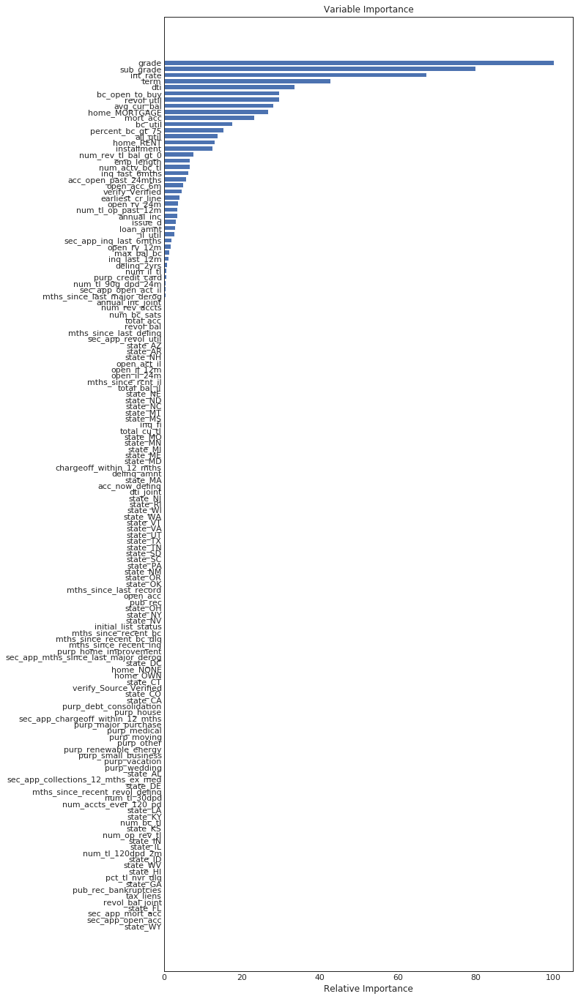

In [29]:
# Check that the top features make sense
rf_feat_imp = rf.feature_importances_
rf_feat_imp = 100.0 * (rf_feat_imp / rf_feat_imp.max())
sorted_idx = np.argsort(rf_feat_imp)
pos = np.arange(sorted_idx.shape[0]) + .5

#Plot
plt.figure(figsize=(10,24))
plt.barh(pos, rf_feat_imp[sorted_idx], align='center')
plt.yticks(pos, X_train.columns[sorted_idx])
plt.xlabel('Relative Importance')
plt.title('Variable Importance');

<b>Summary:</b>

From what the Lasso and the decision tree evaluation returned, below are the most interesting/significant variables. Those are the top 38, ranked by whether they appeared as important in Lasso, Decision tree and Random Forest. Since `sub_grade` is a more detailed view of `grade`, we've only included `sub_grade`.<br>

* `int_rate`<br>
(Interest Rate on the loan)
* `sub_grade`<br>
(LC assigned loan subgrade)
* `avg_cur_bal`<br>
(Average current balance of all accounts)
* `dti`<br>
(A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income)
* `bc_open_to_buy`<br>
(Total open to buy on revolving bankcards)
* `installment`<br>
(The monthly payment owed by the borrower if the loan originates)
* `emp_length`<br>
(Employment length in years. Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years)
* `term`<br>
(The number of payments on the loan. Values are in months and can be either 36 or 60)
* `revol_util`<br>
(Revolving line utilization rate, or the amount of credit the borrower is using relative to all available revolving credit)
* `num_rev_tl_bal_gt_0`<br>
(Number of revolving trades with balance >0)
* `loan_amnt`<br>
(The listed amount of the loan applied for by the borrower. If at some point in time, the credit department reduces the loan amount, then it will be reflected in this value)
* `annual_inc`<br>
(The self-reported annual income provided by the borrower during registration)
* `mort_acc`<br>
(Number of mortgage accounts)
* `max_bal_bc`<br>
(Maximum current balance owed on all revolving accounts)
* `all_util`<br>
(Balance to credit limit on all trades)
* `home_ownership`<br>
(The home ownership status provided by the borrower during registration or obtained from the credit report. Our values are: RENT, OWN, MORTGAGE, OTHER)
* `total_bal_il`<br>
(Total current balance of all installment accounts)
* `pct_tl_nvr_dlq`<br>
(Percent of trades never delinquent)
* `earliest_cr_line`<br>
(The month the borrower's earliest reported credit line was opened)
* `bc_util`<br>
(Ratio of total current balance to high credit/credit limit for all bankcard accounts)
* `revol_bal`<br>
(Total credit revolving balance)
* `total_acc`<br>
(The total number of credit lines currently in the borrower's credit file)
* `num_il_tl`<br>
(Number of installment accounts)
* `acc_open_past_24mths`<br>
(Number of trades opened in past 24 months)
* `il_util`<br>
(Ratio of total current balance to high credit/credit limit on all install acct)
* `percent_bc_gt_75`<br>
(Percentage of all bankcard accounts > 75% of limit)
* `delinq_amnt`<br>
(The past-due amount owed for the accounts on which the borrower is now delinquent)
* `open_rv_24m`<br>
(Number of revolving trades opened in past 24 months)
* `num_actv_bc_tl`<br>
(Number of currently active bankcard accounts)
* `num_bc_sats`<br>
(Number of satisfactory bankcard accounts)
* `open_rv_12m`<br>
(Number of revolving trades opened in past 12 months)
* `num_rev_accts`<br>
(Number of revolving accounts)
* `open_acc_6m`<br>
(Number of open trades in last 6 months)
* `open_act_il`<br>
(Number of currently active installment trades)
* `num_op_rev_tl`<br>
(Number of open revolving accounts)
* `total_cu_tl`<br>
(Number of finance trades)
* `num_bc_tl`<br>
(Number of bankcard accounts)
* `inq_fi`<br>
(Number of personal finance inquiries)
* `inq_last_6mths`<br>
(The number of inquiries in past 6 months (excluding auto and mortgage inquiries))
* `open_acc`<br>
(The number of open credit lines in the borrower's credit file)

<div class='exercise'><b> Part 5: Exploring the data </b></div>


In [84]:
# create dataframe with relevant predictors plus the response variable
eda_predictors = ['int_rate', 'sub_grade', 'avg_cur_bal', 'dti', 'bc_open_to_buy', 'installment', 
                  'emp_length', 'term', 'revol_util', 'num_rev_tl_bal_gt_0', 
                  'loan_amnt', 'annual_inc', 'mort_acc', 'max_bal_bc', 'all_util', 'home_MORTGAGE',
                  'home_RENT', 'total_bal_il', 'pct_tl_nvr_dlq', 'earliest_cr_line', 
                  'bc_util', 'revol_bal', 'total_acc', 'num_il_tl', 'acc_open_past_24mths', 
                  'il_util', 'percent_bc_gt_75', 'delinq_amnt', 'open_rv_24m', 
                  'num_actv_bc_tl', 'num_bc_sats', 'open_rv_12m', 'num_rev_accts', 
                  'open_acc_6m', 'open_act_il', 'num_op_rev_tl', 
                  'total_cu_tl', 'num_bc_tl', 'inq_fi', 'inq_last_6mths', 
                  'open_acc', 'loan_status']

# this reduced dataframe is created to be able to run a pairplot analysis
df_eda = df[eda_predictors]

In [85]:
df_eda.shape

(20000, 42)

In [42]:
sns.pairplot(df_eda.sample(1000), hue='loan_status');

## Some general functions to use for displaying plots

In [43]:
def get_barplot(x,y):
    '''Function to display regular bar plots
    Inputs:
        x: pd.Series representing the x values
        y: pd.Series representing the y values
    '''
    title = y.name + ' over ' + x.name
    plt.figure(figsize=(14,8))
    plt.bar(x, y, align='center', alpha=0.6)
    plt.title(title, fontsize=16)
    plt.xlabel(x.name, fontsize=14)
    plt.ylabel(y.name, fontsize=14)
    plt.grid()
    plt.show()

In [44]:
def get_hbarplot(x,y):
    '''Function to display horizontal bar plots
    Inputs:
        x: pd.Series representing the x values
        y: pd.Series representing the y values
    '''
    title = y.name + ' over ' + x.name
    plt.figure(figsize=(10,14))
    plt.barh(x, y, align='center', alpha=0.6)
    plt.title(title, fontsize=16)
    plt.xlabel(y.name, fontsize=14)
    plt.ylabel(x.name, fontsize=14)
    plt.grid()
    plt.show()

In [45]:
def get_histogram(y,b):
    '''Function to display a histogram
    Inputs:
        y: pd.Series representing the values to display
        b: the number of bins to show
    '''
    title = 'Distribution of ' + y.name
    plt.figure(figsize=(14,8))
    plt.hist(y, bins=b)
    plt.title(title, fontsize=16)
    plt.xlabel(y.name, fontsize=14)
    plt.ylabel("Numbers of {}".format(y.name), fontsize=14)
    plt.grid()
    plt.show()

In [46]:
def get_violinplot(x, y, data):
    '''Function to display violin plots
    Inputs:
        x: a string used with data to represent the x axis values
        y: a string used to represent the y axis values
        data: the dataframe
    '''
    title = y + ' over ' + x
    x_category = np.sort(data[x].unique())

    fig, ax1 = plt.subplots(figsize=(15, 8), sharey=True)

    for idx, val in enumerate(x_category):
        parts = ax1.violinplot(data.loc[data[x]==val, y], positions=[idx], 
                               showmeans=True, showmedians=True, showextrema=True)
        for pc in parts['bodies']:
            pc.set_facecolor('#D43F3A')
            pc.set_edgecolor('black')
            pc.set_alpha(.6)

        for partname in ('cbars','cmins','cmaxes', 'cmedians', 'cmeans'):
            vp = parts[partname]
            vp.set_edgecolor('black')
            vp.set_alpha(0.6)

    ax1.set_title(title, fontsize=16)
    ax1.set_xlabel(x, fontsize=14)
    ax1.set_ylabel(y, fontsize=14)
    ax1.set_xticks(np.arange(x_category.size))
    ax1.set_xticklabels(x_category)
    plt.show()

## Analyze the distribution of the loan amounts

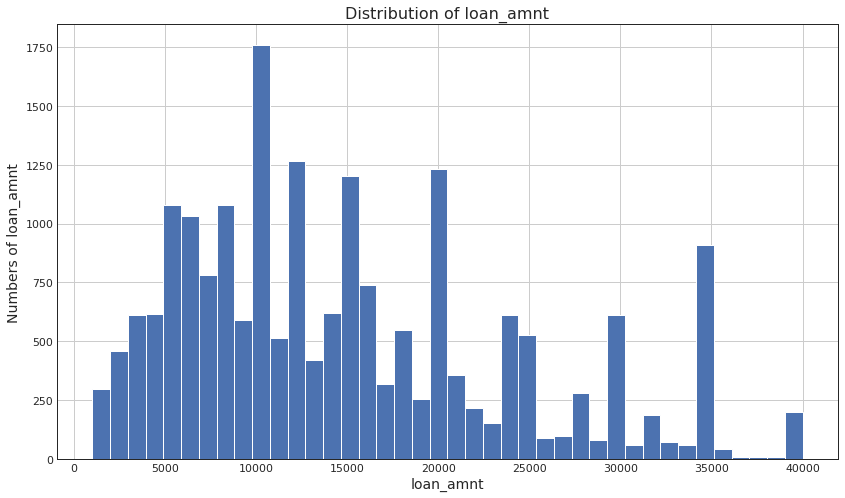

In [47]:
get_histogram(original_df['loan_amnt'], 40)

In [51]:
original_df['loan_amnt'].describe()

count    20000.000000
mean     14845.695000
std       9175.396697
min       1000.000000
25%       8000.000000
50%      12500.000000
75%      20000.000000
max      40000.000000
Name: loan_amnt, dtype: float64

We can see that the round \\$5000 increement loan amounts <b>(e.g. 10k, 15k, 20k, etc) are the most popular</b>. Most loans are aound $10000 and gradually decrease from there up to \\$35k where they increase again slightly.<br>
<b>50% of all loans are below \\$12,000 and 75% below \\$20,000</b>.

## Analyze the loan amount by sub grade

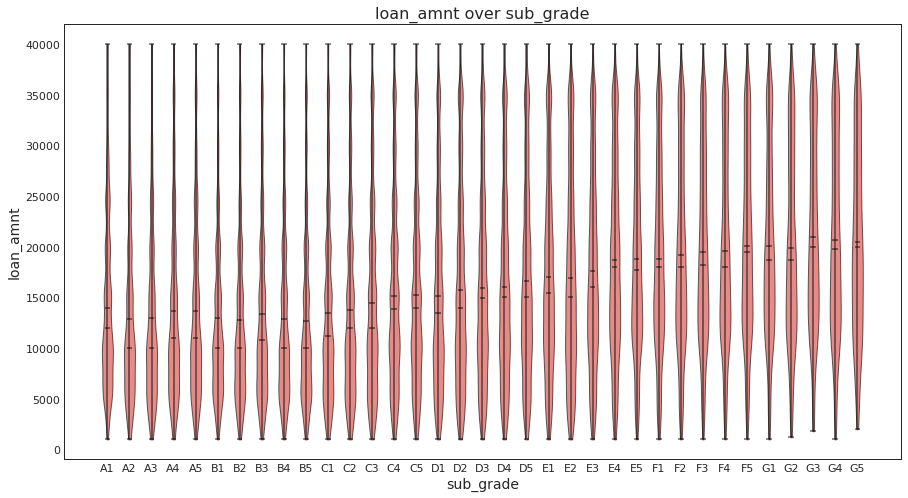

In [83]:
get_violinplot('sub_grade', 'loan_amnt', original_df)

We can see a trend that looks like <b>smaller loans are usually taken borrower with higher ratings (grade) and higher loans are usually taken by borrowers with lower credit ratings</b>.

## Analyze loans issued and interest rates by states and sub grades

We can also show the <b>number of loans, the average income and interest rate</b> by state to see where most loans were made and under which conditions.

In [55]:
by_loan_amount = original_df.groupby(['addr_state'], as_index=False).loan_amnt.sum()
by_interest_rate = original_df.groupby(['addr_state'], as_index=False).int_rate.mean()
by_income = original_df.groupby(['addr_state'], as_index=False).annual_inc.mean()

states = by_loan_amount['addr_state'].values.tolist()
average_loan_amounts = by_loan_amount['loan_amnt'].values.tolist()
average_interest_rates = by_interest_rate['int_rate'].values.tolist()
average_annual_income = by_income['annual_inc'].values.tolist()

from collections import OrderedDict

metrics_data = OrderedDict([('state_codes', states),
                            ('issued_loans', average_loan_amounts),
                            ('interest_rate', average_interest_rates),
                            ('annual_income', average_annual_income)])
                     
metrics_df = pd.DataFrame.from_dict(metrics_data)
metrics_df = metrics_df.round(decimals=2)
metrics_df.head()

,state_codes,issued_loans,interest_rate,annual_income
0,AK,12491300.0,13.53,80730.84
1,AL,55503475.0,14.13,71242.99
2,AR,33473650.0,13.92,69699.80
3,AZ,122958650.0,13.46,75824.19
4,CA,725545250.0,13.54,87677.63


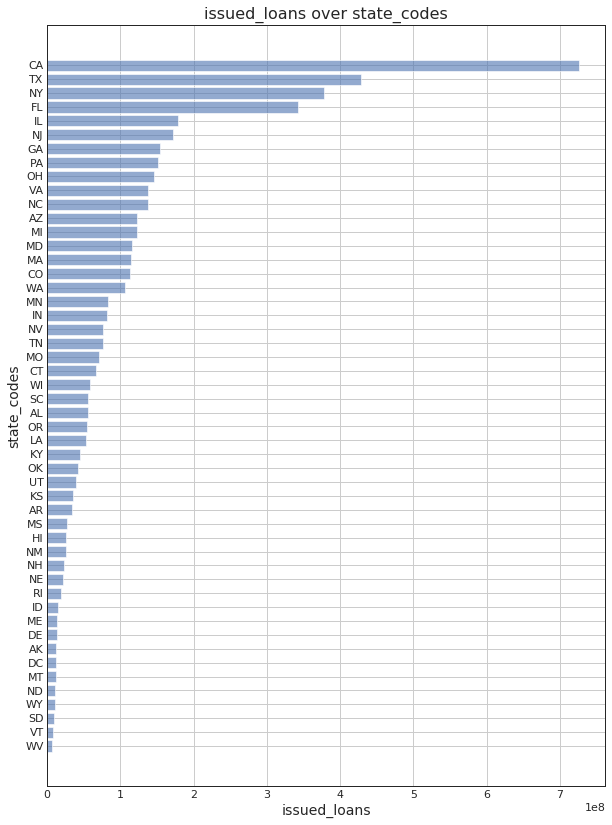

In [56]:
data = metrics_df.sort_values(['issued_loans'])
get_hbarplot(data['state_codes'], data['issued_loans'])

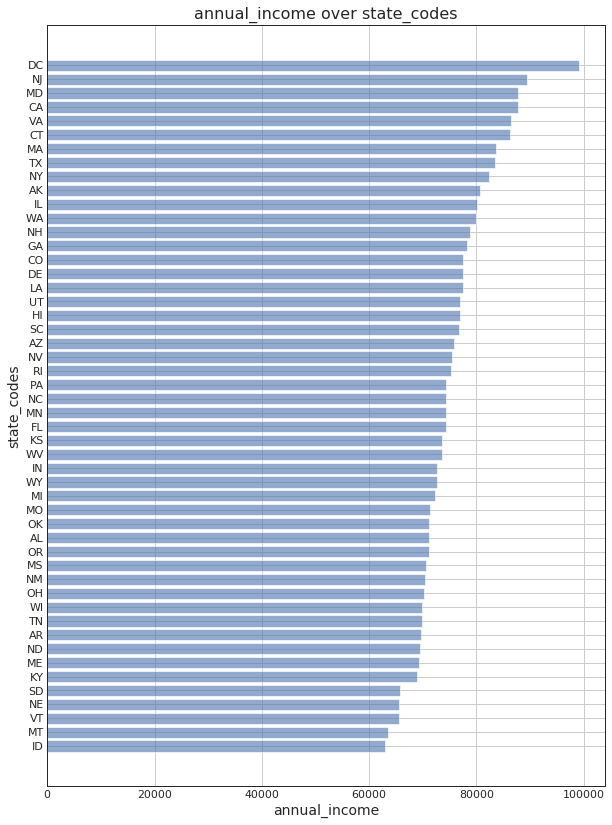

In [57]:
data = metrics_df.sort_values(['annual_income'])
get_hbarplot(data['state_codes'], data['annual_income'])

In [58]:
high_loan_states = ['CA', 'TX', 'NY', 'FL']
highloans = metrics_df[metrics_df['state_codes'].isin(high_loan_states)]
display(highloans)

highloans_perc = (highloans['issued_loans'].sum() / metrics_df['issued_loans'].sum()) * 100
print("Percentage of loans made in states CA, TX, NY, FL relative to all loans: {:.2f}".format(highloans_perc))

,state_codes,issued_loans,interest_rate,annual_income
4,CA,725545250.0,13.54,87677.63
9,FL,342036825.0,13.82,74264.63
33,NY,377734975.0,13.89,82417.00
42,TX,427782800.0,13.57,83526.73


Percentage of loans made in states CA, TX, NY, FL relative to all loans: 38.72


When looking at the data, we can see that the 4 states of <b>CA, TX, NY and FL have issued almost 40%</b> of all loans in 2016 and 2017.<br><br>
When looking at the average <b>annual incomes</b>, 3 states (CA, NY and TX) are somewhere in the top 10 of states but FL is on rank. This leaves the question as to why there have been so many loans in FL?

It looks like the average interest rate is fairly evenly distributed across the states, roughly between 12,5 to 14,5% (see below).

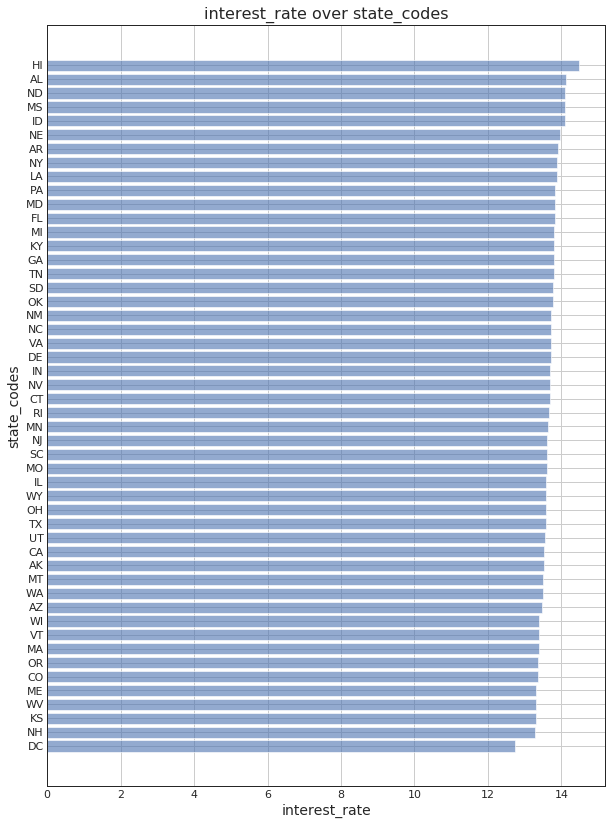

In [59]:
data = metrics_df.sort_values(['interest_rate'])
get_hbarplot(data['state_codes'], data['interest_rate'])

### Interest Rate by Sub Grade

In [60]:
group1 = original_df.groupby(['sub_grade'], as_index=False).int_rate.mean()
group1.head()

,sub_grade,int_rate
0,1,5.320000
1,2,6.764011
2,3,7.147513
3,4,7.464228
4,5,8.032007


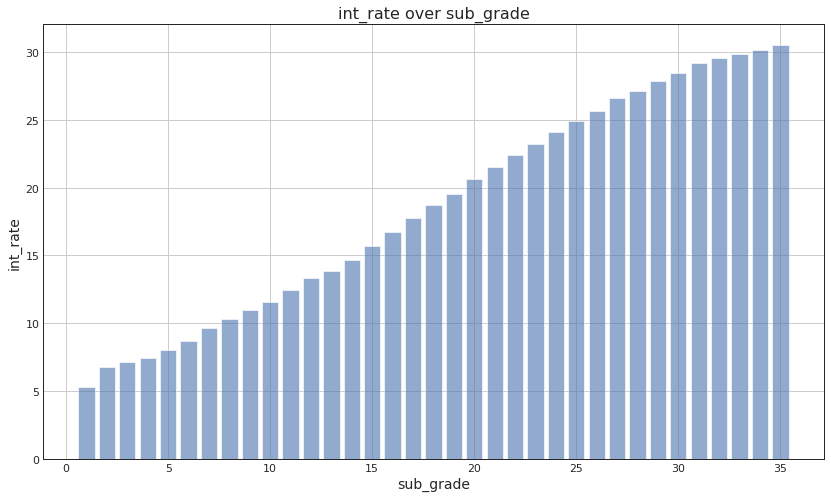

In [61]:
get_barplot(group1['sub_grade'], group1['int_rate'])

We see what we would've expected, that <b>interest rates go up, as the loan sub grades decrease</b>.

## Analyze loan default rates

### defaulted loans based on interest rates

In [80]:
original_df['int_round'] = original_df['int_rate'].round(0).astype(int)
df_y = original_df[['int_round','loan_status']]
crosst_y = pd.crosstab(original_df['int_round'], original_df['loan_status'])
crosst_y['Fully Paid %'] = crosst_y['Fully Paid'] / (crosst_y['Fully Paid'] + crosst_y['Charged Off'])*100
crosst_y

loan_status,Charged Off,Fully Paid,Fully Paid %
int_round,,,
5,504,11810,95.907098
6,276,3428,92.548596
7,1538,18841,92.453015
8,2702,20635,88.421819
9,2412,15833,86.779940
10,3049,18015,85.525066
11,8184,34952,81.027448
12,2559,9219,78.273051
13,7896,25552,76.393207


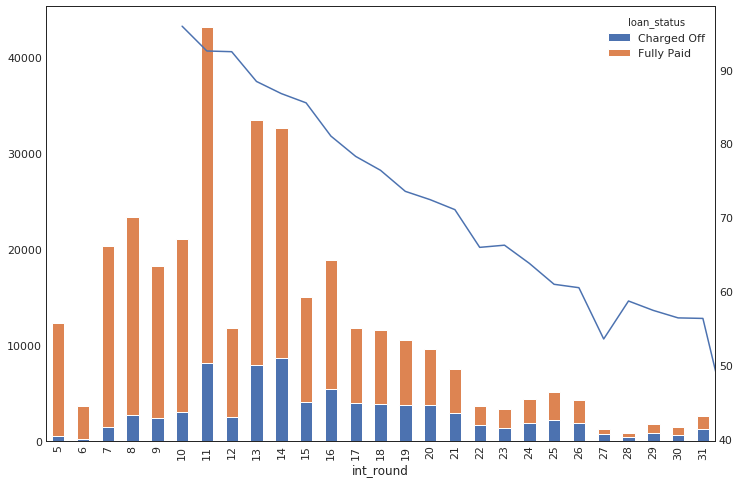

In [81]:
crosst_y[['Charged Off','Fully Paid']].plot(kind='bar', stacked=True,figsize=(12,8))
ax2 = plt.twinx()
sns.lineplot(data=crosst_y['Fully Paid %'], color="b", ax=ax2)
plt.show()

It seems like the <b>interest rate is a reliable predictor</b> of which loans might default in the future. Higher interest rate loans are more likely to default.

### defaulted loans based on loan purpose and loan grades

In [97]:
cm = sns.light_palette("red", as_cmap=True)
crosst = pd.crosstab(original_df['purpose'], original_df['loan_status'])
crosst['Charged Off %'] = crosst['Charged Off'] / (crosst['Fully Paid'] + crosst['Charged Off'])*100
crosst.style.background_gradient(cmap = cm)

loan_status,Charged Off,Fully Paid,Charged Off %
purpose,,,
car,662,3228,17.018
credit_card,13753,50928,21.2628
debt_consolidation,47602,144826,24.7376
home_improvement,5138,20460,20.0719
house,470,1575,22.9829
major_purchase,1856,6441,22.3695
medical,1211,3419,26.1555
moving,766,2036,27.3376
other,5509,17519,23.9231


From the original data set we know our "base charged off rate", meaning the % of all charged off loans over all loans made in 2016-2017 is <b>23.64%</b>. This means all loan purposes that show a higher percentage, are at a higher risk than average to default. In this case that is <b>dept_collection, medical, moving, renewable_energy, small_business and other</b>.

In [98]:
loan_grade = ['loan_status', 'grade']
cm = sns.light_palette("red", as_cmap=True)
cross_u = pd.crosstab(df[loan_grade[0]], original_df[loan_grade[1]], normalize='columns').style.background_gradient(cmap = cm)
cross_u

grade,A,B,C,D,E,F,G
loan_status,,,,,,,
Charged Off,0.207161,0.380218,0.528376,0.633006,0.702936,0.793609,0.774648
Fully Paid,0.792839,0.619782,0.471624,0.366994,0.297064,0.206391,0.225352


We see above that <b>loans with grades of D and lower</b> are more likely to lead to a default in the future than higher rated loans with for instance grades A or B.

### defaulted loans based on state

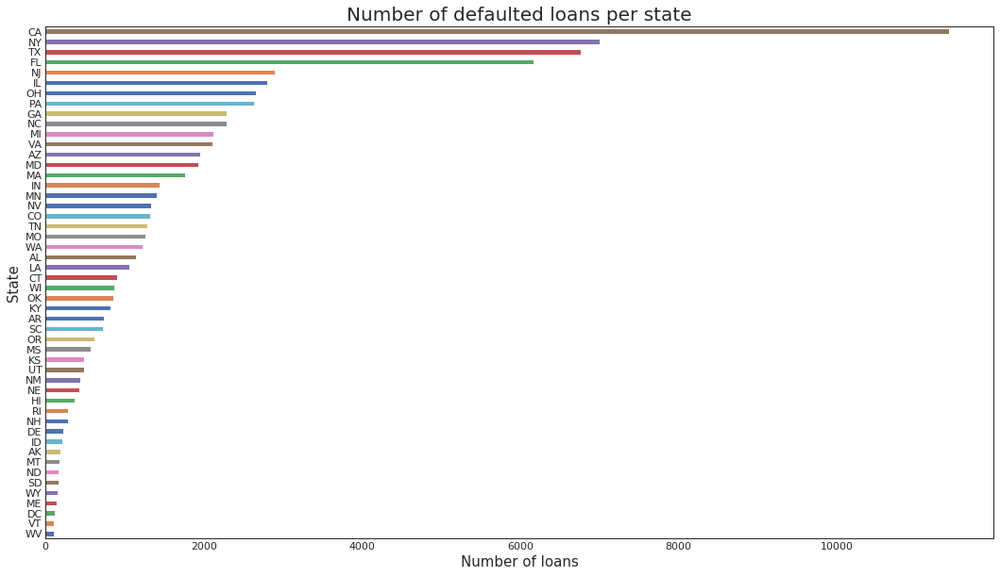

In [95]:
fig = plt.figure(figsize=(18,10))
original_df[original_df['loan_status']=="Charged Off"].groupby('addr_state')['loan_status'].count().sort_values().plot(kind='barh')
plt.ylabel('State',fontsize=15)
plt.xlabel('Number of loans',fontsize=15)
plt.title('Number of defaulted loans per state',fontsize=20);

The states of <b>CA, NY, TX and FL have the highest default rates</b> but that is simply because they have the highest number of loans in general. If we wanted to get a more accurate default rate by state, we may have to calculate the defaulted loans relative to the number of loans issued in that state and then compare that to the national default average of <b>23.64%</b>. The table below shows the states with a higher risk of default compared to the national average.

In [116]:
average = 23.64

crosst = pd.crosstab(original_df['addr_state'], original_df['loan_status'])
crosst['Charged Off %'] = crosst['Charged Off'] / (crosst['Fully Paid'] + crosst['Charged Off'])*100
crosst.sort_values('Charged Off %', ascending=False)[crosst['Charged Off %'] > average]

/Users/rs/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



loan_status,Charged Off,Fully Paid,Charged Off %
addr_state,,,
AR,734,1802,28.943218
LA,1063,2672,28.460509
MS,572,1451,28.274839
OK,861,2192,28.201769
AL,1139,2971,27.712895
NY,7005,18971,26.967200
NJ,2894,8350,25.738171
NE,430,1244,25.686977
MD,1938,5618,25.648491
